In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import os

In [2]:
train_data = '/kaggle/input/cat-and-dog/training_set/training_set'

In [3]:
dogs_train = os.listdir(os.path.join(train_data + "/dogs"))
cat_train = os.listdir(os.path.join(train_data + "/cats"))

In [4]:
dog_paths = [os.path.join(train_data, "dogs", dog) for dog in dogs_train]
cat_paths = [os.path.join(train_data, "cats", cat) for cat in cat_train]

In [5]:
# Create a dataframe with two columns: 'path' and 'label'
data = pd.DataFrame({
    'path': dog_paths + cat_paths,
    'label': ['dog'] * len(dog_paths) + ['cat'] * len(cat_paths)
})

In [6]:
data['path'][1]

'/kaggle/input/cat-and-dog/training_set/training_set/dogs/dog.1942.jpg'

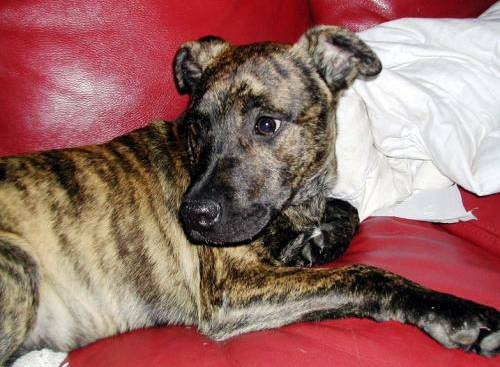

In [7]:
from PIL import Image 
image_path = data['path'][2]
img = Image.open(image_path)
img

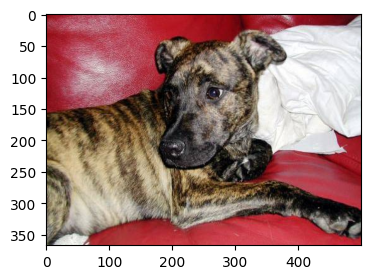

In [8]:
plt.figure(figsize = (15,3))
plt.imshow(img)
plt.show()

In [9]:
data['path'][2].split('/')[-1]

'dog.375.jpg'

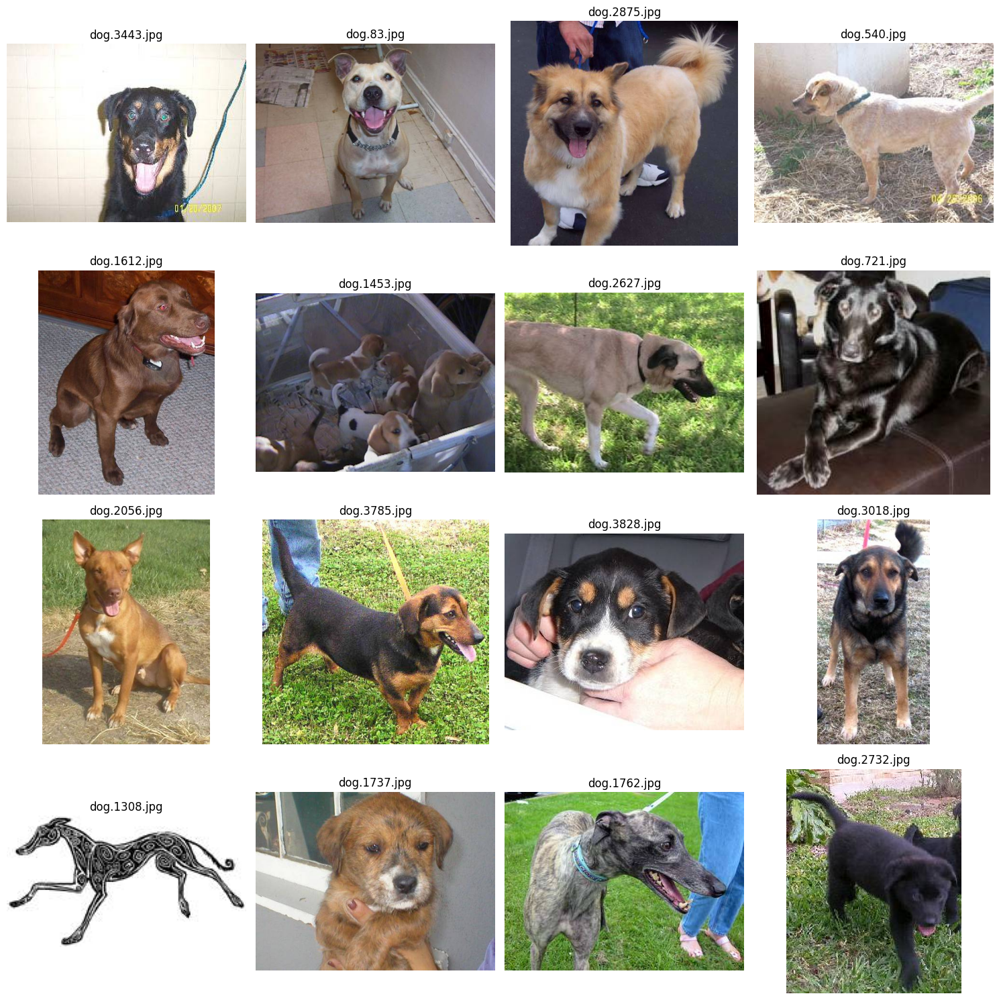

In [10]:
plt.figure(figsize = (15,15))
for i in range(16):
    image_path = data['path'][i*8]
    img = Image.open(image_path)
    plt.subplot(4,4,i+1)
    plt.imshow(img)
    plt.title(data['path'][i*8].split('/')[-1])
    plt.axis('off')

plt.tight_layout()
plt.show()

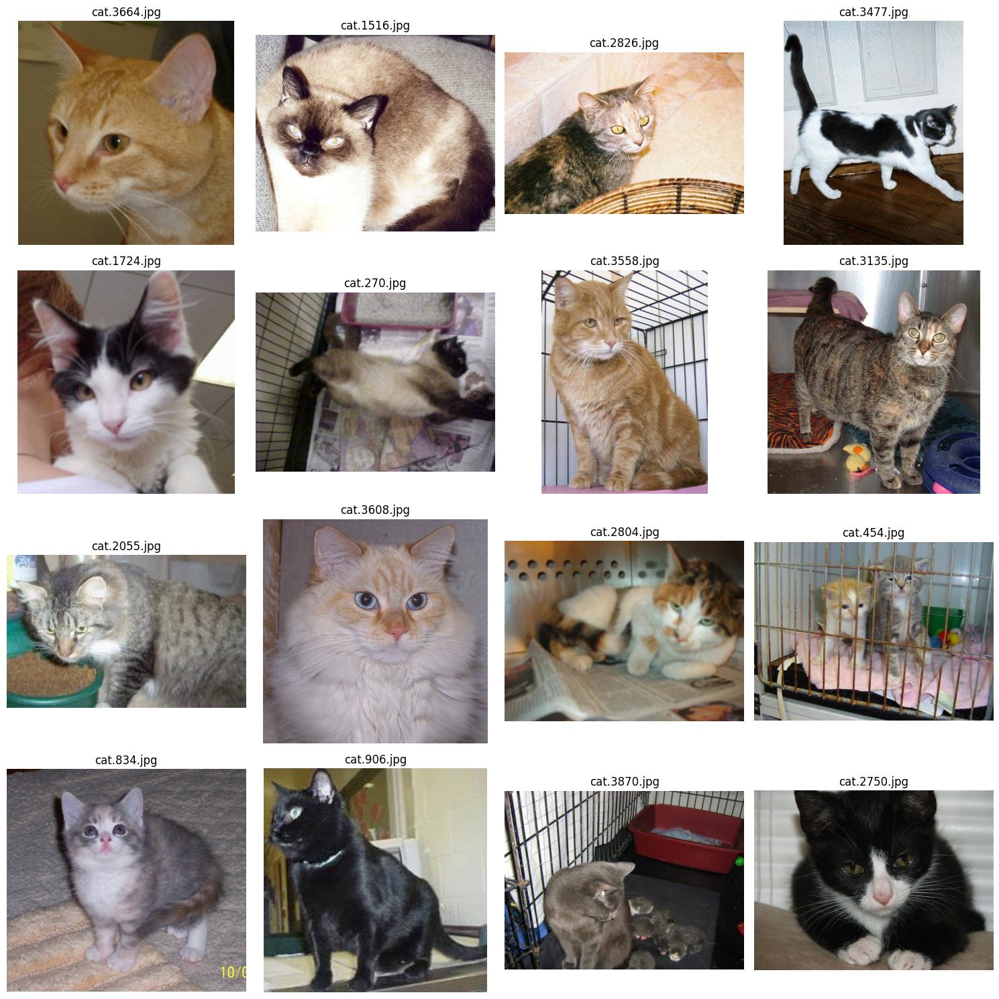

In [11]:
plt.figure(figsize = (15,15))
for i in range(16):
    image_path = data['path'].iloc[-(i+1)]
    img = Image.open(image_path)
    plt.subplot(4,4,i+1)
    plt.imshow(img)
    plt.title(image_path.split('/')[-1])
    plt.axis('off')

plt.tight_layout()
plt.show()

In [12]:
import os
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms

In [13]:
class CatAndDogDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform

        # Get list of image file names and their corresponding labels
        self.img_labels = []
        valid_extensions = ['.jpg', '.jpeg', '.png']  # Add more extensions if needed
        for label, sub_dir in enumerate(['cats', 'dogs']):
            sub_dir_path = os.path.join(root_dir, sub_dir)
            for img_name in os.listdir(sub_dir_path):
                if any(img_name.lower().endswith(ext) for ext in valid_extensions):
                    self.img_labels.append((os.path.join(sub_dir_path, img_name), label))

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path, label = self.img_labels[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

In [14]:
# Define image transformations
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize images to 128x128
    transforms.ToTensor(),          # Convert the image to a tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize as in ImageNet
])

In [15]:
dataset = CatAndDogDataset(root_dir=train_data, transform=transform)

In [16]:
len(dataset)

8005

In [17]:
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

In [18]:
for images, labels in dataloader:
    print(images.shape)  # Should print the shape of the batch, e.g., [32, 3, 128, 128]
    print(labels)        # The corresponding labels
    break

torch.Size([32, 3, 128, 128])
tensor([0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1,
        1, 0, 1, 1, 1, 0, 1, 1])


In [19]:
train_size = int(len(dataset) * 0.8)
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size = 32, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 32, shuffle = False)

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim

In [21]:
import torchvision.models as models
import torchvision.transforms as transforms
from tqdm import tqdm

In [22]:
# 1. Load the Pre-trained ResNet-50 Model
model = models.resnet50(pretrained=True)

# 2. Modify the Final Fully Connected Layer
num_ftrs = model.fc.in_features
num_classes = 2 
model.fc = nn.Linear(num_ftrs, num_classes)

# 3. Define Loss Function and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 172MB/s]


In [23]:
# 4. Define Training and Evaluation Loop
def train_model(model, dataloader, criterion, optimizer, num_epochs=10):
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model.to(device)
        
    for epoch in range(10):
        model.train()
        running_loss = 0.0
        
        # Wrap the DataLoader with tqdm for progress tracking
        for images, labels in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch'):
                images, labels = images.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                
                running_loss += loss.item() * images.size(0)
        
        epoch_loss = running_loss / len(dataloader.dataset)
        print(f'Epoch {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f}')
    
    print('Finished Training')

# Train the model
train_model(model, train_loader, criterion, optimizer)


Epoch 1/10: 100%|██████████| 201/201 [01:11<00:00,  2.83batch/s]


Epoch 1/10 Loss: 0.1758


Epoch 2/10: 100%|██████████| 201/201 [00:35<00:00,  5.74batch/s]


Epoch 2/10 Loss: 0.0445


Epoch 3/10: 100%|██████████| 201/201 [00:35<00:00,  5.69batch/s]


Epoch 3/10 Loss: 0.0193


Epoch 4/10: 100%|██████████| 201/201 [00:35<00:00,  5.74batch/s]


Epoch 4/10 Loss: 0.0088


Epoch 5/10: 100%|██████████| 201/201 [00:35<00:00,  5.69batch/s]


Epoch 5/10 Loss: 0.0051


Epoch 6/10: 100%|██████████| 201/201 [00:34<00:00,  5.77batch/s]


Epoch 6/10 Loss: 0.0042


Epoch 7/10: 100%|██████████| 201/201 [00:34<00:00,  5.76batch/s]


Epoch 7/10 Loss: 0.0037


Epoch 8/10: 100%|██████████| 201/201 [00:34<00:00,  5.76batch/s]


Epoch 8/10 Loss: 0.0039


Epoch 9/10: 100%|██████████| 201/201 [00:34<00:00,  5.74batch/s]


Epoch 9/10 Loss: 0.0024


Epoch 10/10: 100%|██████████| 201/201 [00:35<00:00,  5.72batch/s]

Epoch 10/10 Loss: 0.0026
Finished Training


In [24]:
torch.save(model.state_dict(), '/kaggle/working/model1.pth')
print("Model weights have been saved to 'model1.pth'")

Model weights have been saved to 'model1.pth'


In [25]:
from torchmetrics import Precision, Recall

# Initialize metrics for binary classification
metric_precision = Precision(task = 'binary', num_classes=2, average='macro', compute_on_cpu=True)
metric_recall = Recall(task = 'binary', num_classes=2, average='macro', compute_on_cpu=True)

model.eval()
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        
        # Update the metrics
        metric_precision.update(preds.cpu(), labels.cpu())
        metric_recall.update(preds.cpu(), labels.cpu())

    # Compute the final metric values
    final_precision = metric_precision.compute()
    final_recall = metric_recall.compute()

    print(f'Precision: {final_precision.item()}')
    print(f'Recall: {final_recall.item()}')


Precision: 0.9653035998344421
Recall: 0.9885786771774292


In [26]:
model.load_state_dict(torch.load('model1.pth'))  # Load the model weights
model.eval()  # Set the model to evaluation mode

/tmp/ipykernel_22/4034827129.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('model1.pth'))  # Load the model weights


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [27]:
test_data = '/kaggle/input/cat-and-dog/test_set/test_set'

dogs_test = os.listdir(os.path.join(test_data + "/dogs"))
cat_test = os.listdir(os.path.join(test_data + "/cats"))

dog_paths = [os.path.join(test_data, "dogs", dog) for dog in dogs_test]
cat_paths = [os.path.join(test_data, "cats", cat) for cat in cat_test]

# Create a dataframe with two columns: 'path' and 'label'
data = pd.DataFrame({
    'path': dog_paths + cat_paths,
    'label': ['dog'] * len(dog_paths) + ['cat'] * len(cat_paths)
})

In [28]:
# Helper function to get random image paths
def get_random_image_paths(data, num_images=16):
    random_indices = random.sample(range(len(data['path'])), num_images)
    return [data['path'][i] for i in random_indices]

In [29]:
import random
# Load a batch of random images
random_image_paths = get_random_image_paths(data, num_images=16)

# Prepare the images for prediction
images = []
for image_path in random_image_paths:
    img = Image.open(image_path).convert('RGB')
    img = transform(img)  # Apply the same transformations used during training
    images.append(img)
    
# Stack the images to create a batch
images = torch.stack(images)

In [30]:
def predict_image(image_path):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    image = transform(image)
    image = image.unsqueeze(0)  # Add batch dimension
    
    # Move the image to the same device as the model
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    image = image.to(device)
    
    # Make predictions
    with torch.no_grad():
        outputs = model(image)
        _, predicted = torch.max(outputs, 1)
    
    return predicted.item()

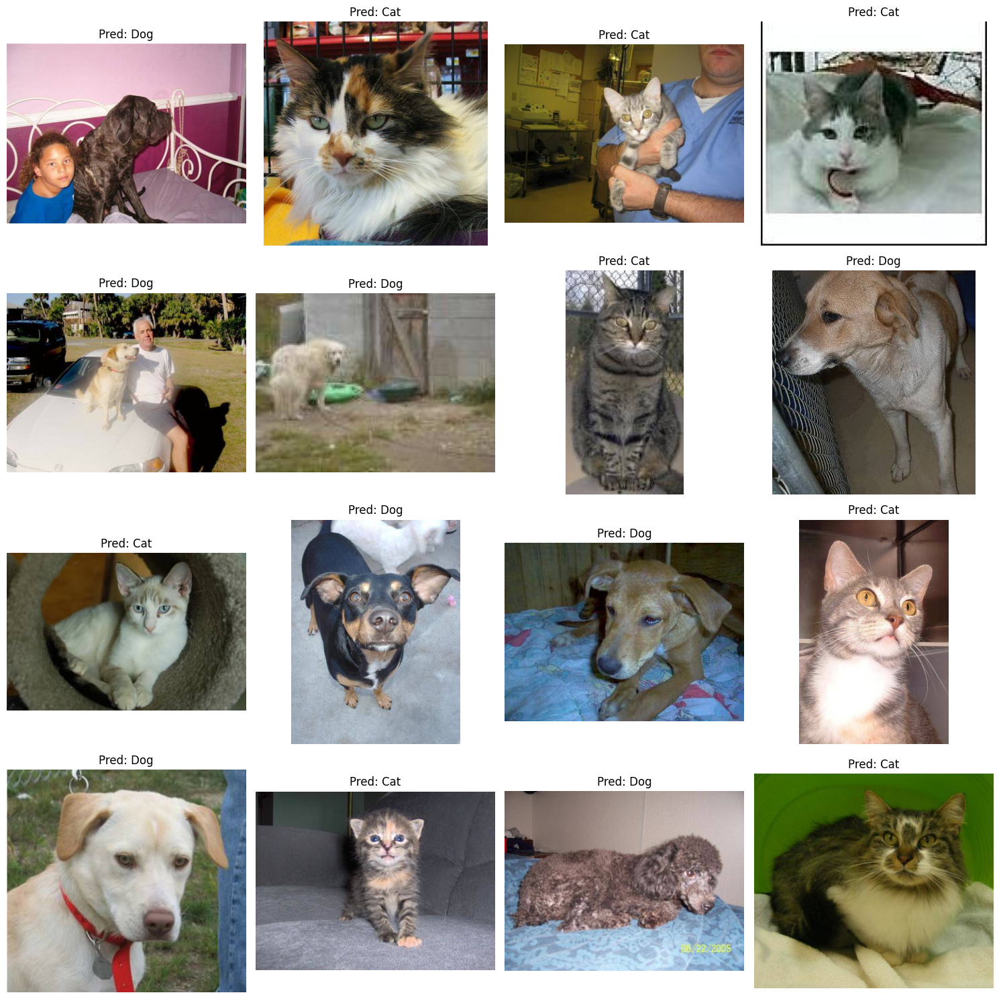

In [31]:
# Plot images with predictions
plt.figure(figsize=(15, 15))
for i, image_path in enumerate(random_image_paths):
    # Load the image for plotting
    img = Image.open(image_path).convert('RGB')
    
    # Make prediction
    prediction = predict_image(image_path)
    label = 'Cat' if prediction == 0 else 'Dog'
    
    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(f"Pred: {label}")
    plt.axis('off')

plt.tight_layout()
plt.show()